In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Base Line

## Imports

In [9]:
# colab only

# !pip install iterative-stratification
# !pip install optuna
# !pip install --upgrade category_encoders
# !pip install catboost

In [10]:
import sys
sys.path.append('../input/iterativestratification')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from scipy.stats import norm, skew, kurtosis
import warnings

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from tqdm.auto import tqdm

from sklearn.metrics import roc_auc_score, accuracy_score, log_loss
from sklearn.ensemble import RandomForestClassifier



from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter("ignore", category=ConvergenceWarning)
warnings.filterwarnings('ignore')

plt.style.use('ggplot')
cust_color = [
    '#EDC7B7',
    '#EEE2DC',
    '#BAB2B5',
    '#123C69',
    '#AC3B61'
]
plt.rcParams['figure.figsize'] = (12,4)
plt.rcParams['figure.dpi'] = 300
plt.rcParams["axes.grid"] = False
plt.rcParams["grid.color"] = cust_color[3]
plt.rcParams["grid.alpha"] = 0.5
plt.rcParams["grid.linestyle"] = '--'
plt.rcParams["font.family"] = "monospace"

plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['figure.frameon'] = True
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.bottom'] = True
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.linewidth'] = 0.5

## Data Load

In [11]:
train = pd.read_csv('/content/drive/MyDrive/Kaggle/SC_PJ/icr-identify-age-related-conditions (1).zip (Unzipped Files)/train.csv')
test = pd.read_csv('/content/drive/MyDrive/Kaggle/SC_PJ/icr-identify-age-related-conditions (1).zip (Unzipped Files)/test.csv')
greeks = pd.read_csv('/content/drive/MyDrive/Kaggle/SC_PJ/icr-identify-age-related-conditions (1).zip (Unzipped Files)/greeks.csv')

pd.set_option('display.max_columns', None)

In [12]:
train.head(3)

,Id,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,BN,BP,BQ,BR,BZ,CB,CC,CD,CF,CH,CL,CR,CS,CU,CW,DA,DE,DF,DH,DI,DL,DN,DU,DV,DY,EB,EE,EG,EH,EJ,EL,EP,EU,FC,FD,FE,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL,Class
0,000ff2bfdfe9,0.209377,3109.03329,85.200147,22.394407,8.138688,0.699861,0.025578,9.812214,5.555634,4126.58731,22.5984,175.638726,152.707705,823.928241,257.432377,47.223358,0.563481,23.387600,4.851915,0.023482,1.050225,0.069225,13.784111,1.302012,36.205956,69.08340,295.570575,0.23868,0.284232,89.245560,84.31664,29.657104,5.310690,1.74307,23.187704,7.294176,1.987283,1433.166750,0.949104,B,30.879420,78.526968,3.828384,13.394640,10.265073,9028.291921,3.583450,7.298162,1.73855,0.094822,11.339138,72.611063,2003.810319,22.136229,69.834944,0.120343,1
1,007255e47698,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,5496.92824,19.4205,155.868030,14.754720,51.216883,257.432377,30.284345,0.484710,50.628208,6.085041,0.031442,1.113875,1.117800,28.310953,1.357182,37.476568,70.79836,178.553100,0.23868,0.363489,110.581815,75.74548,37.532000,0.005518,1.74307,17.222328,4.926396,0.858603,1111.287150,0.003042,A,109.125159,95.415086,52.260480,17.175984,0.296850,6785.003474,10.358927,0.173229,0.49706,0.568932,9.292698,72.611063,27981.562750,29.135430,32.131996,21.978000,0
2,013f2bd269f5,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,5135.78024,26.4825,128.988531,219.320160,482.141594,257.432377,32.563713,0.495852,85.955376,5.376488,0.036218,1.050225,0.700350,39.364743,1.009611,21.459644,70.81970,321.426625,0.23868,0.210441,120.056438,65.46984,28.053464,1.289739,1.74307,36.861352,7.813674,8.146651,1494.076488,0.377208,B,109.125159,78.526968,5.390628,224.207424,8.745201,8338.906181,11.626917,7.709560,0.97556,1.198821,37.077772,88.609437,13676.957810,28.022851,35.192676,0.196941,0


## EDA

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 617 entries, 0 to 616
Data columns (total 58 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      617 non-null    object 
 1   AB      617 non-null    float64
 2   AF      617 non-null    float64
 3   AH      617 non-null    float64
 4   AM      617 non-null    float64
 5   AR      617 non-null    float64
 6   AX      617 non-null    float64
 7   AY      617 non-null    float64
 8   AZ      617 non-null    float64
 9   BC      617 non-null    float64
 10  BD      617 non-null    float64
 11  BN      617 non-null    float64
 12  BP      617 non-null    float64
 13  BQ      557 non-null    float64
 14  BR      617 non-null    float64
 15  BZ      617 non-null    float64
 16  CB      615 non-null    float64
 17  CC      614 non-null    float64
 18  CD      617 non-null    float64
 19  CF      617 non-null    float64
 20  CH      617 non-null    float64
 21  CL      617 non-null    float64
 22  CR

In [14]:
# 카테고리 컬럼
num_cols = train.columns.tolist()[1:-1]
cat_cols = 'EJ'
target_col = 'Class'

In [15]:
num_cols

['AB',
 'AF',
 'AH',
 'AM',
 'AR',
 'AX',
 'AY',
 'AZ',
 'BC',
 'BD ',
 'BN',
 'BP',
 'BQ',
 'BR',
 'BZ',
 'CB',
 'CC',
 'CD ',
 'CF',
 'CH',
 'CL',
 'CR',
 'CS',
 'CU',
 'CW ',
 'DA',
 'DE',
 'DF',
 'DH',
 'DI',
 'DL',
 'DN',
 'DU',
 'DV',
 'DY',
 'EB',
 'EE',
 'EG',
 'EH',
 'EJ',
 'EL',
 'EP',
 'EU',
 'FC',
 'FD ',
 'FE',
 'FI',
 'FL',
 'FR',
 'FS',
 'GB',
 'GE',
 'GF',
 'GH',
 'GI',
 'GL']

In [16]:
# 컬럼명 띄어쓰기 제거
train.columns = train.columns.str.strip()
test.columns = test.columns.str.strip()

num_cols = train.columns.tolist()[1:-1]
num_cols

['AB',
 'AF',
 'AH',
 'AM',
 'AR',
 'AX',
 'AY',
 'AZ',
 'BC',
 'BD',
 'BN',
 'BP',
 'BQ',
 'BR',
 'BZ',
 'CB',
 'CC',
 'CD',
 'CF',
 'CH',
 'CL',
 'CR',
 'CS',
 'CU',
 'CW',
 'DA',
 'DE',
 'DF',
 'DH',
 'DI',
 'DL',
 'DN',
 'DU',
 'DV',
 'DY',
 'EB',
 'EE',
 'EG',
 'EH',
 'EJ',
 'EL',
 'EP',
 'EU',
 'FC',
 'FD',
 'FE',
 'FI',
 'FL',
 'FR',
 'FS',
 'GB',
 'GE',
 'GF',
 'GH',
 'GI',
 'GL']

In [17]:
train.shape, test.shape, greeks.shape

((617, 58), (5, 57), (617, 6))

In [18]:
test.head(3)

,Id,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,BN,BP,BQ,BR,BZ,CB,CC,CD,CF,CH,CL,CR,CS,CU,CW,DA,DE,DF,DH,DI,DL,DN,DU,DV,DY,EB,EE,EG,EH,EJ,EL,EP,EU,FC,FD,FE,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL
0,00eed32682bb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,010ebe33f668,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,02fa521e1838,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
greeks.head(3)

,Id,Alpha,Beta,Gamma,Delta,Epsilon
0,000ff2bfdfe9,B,C,G,D,3/19/2019
1,007255e47698,A,C,M,B,Unknown
2,013f2bd269f5,A,C,M,B,Unknown


In [20]:
# 결측치 확인
train.isnull().sum()

Id        0
AB        0
AF        0
AH        0
AM        0
AR        0
AX        0
AY        0
AZ        0
BC        0
BD        0
BN        0
BP        0
BQ       60
BR        0
BZ        0
CB        2
CC        3
CD        0
CF        0
CH        0
CL        0
CR        0
CS        0
CU        0
CW        0
DA        0
DE        0
DF        0
DH        0
DI        0
DL        0
DN        0
DU        1
DV        0
DY        0
EB        0
EE        0
EG        0
EH        0
EJ        0
EL       60
EP        0
EU        0
FC        1
FD        0
FE        0
FI        0
FL        1
FR        0
FS        2
GB        0
GE        0
GF        0
GH        0
GI        0
GL        1
Class     0
dtype: int64

In [21]:
test.isnull().sum()

Id    0
AB    0
AF    0
AH    0
AM    0
AR    0
AX    0
AY    0
AZ    0
BC    0
BD    0
BN    0
BP    0
BQ    0
BR    0
BZ    0
CB    0
CC    0
CD    0
CF    0
CH    0
CL    0
CR    0
CS    0
CU    0
CW    0
DA    0
DE    0
DF    0
DH    0
DI    0
DL    0
DN    0
DU    0
DV    0
DY    0
EB    0
EE    0
EG    0
EH    0
EJ    0
EL    0
EP    0
EU    0
FC    0
FD    0
FE    0
FI    0
FL    0
FR    0
FS    0
GB    0
GE    0
GF    0
GH    0
GI    0
GL    0
dtype: int64

In [22]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 617 entries, 0 to 616
Data columns (total 58 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      617 non-null    object 
 1   AB      617 non-null    float64
 2   AF      617 non-null    float64
 3   AH      617 non-null    float64
 4   AM      617 non-null    float64
 5   AR      617 non-null    float64
 6   AX      617 non-null    float64
 7   AY      617 non-null    float64
 8   AZ      617 non-null    float64
 9   BC      617 non-null    float64
 10  BD      617 non-null    float64
 11  BN      617 non-null    float64
 12  BP      617 non-null    float64
 13  BQ      557 non-null    float64
 14  BR      617 non-null    float64
 15  BZ      617 non-null    float64
 16  CB      615 non-null    float64
 17  CC      614 non-null    float64
 18  CD      617 non-null    float64
 19  CF      617 non-null    float64
 20  CH      617 non-null    float64
 21  CL      617 non-null    float64
 22  CR

In [23]:
train.describe()

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,BN,BP,BQ,BR,BZ,CB,CC,CD,CF,CH,CL,CR,CS,CU,CW,DA,DE,DF,DH,DI,DL,DN,DU,DV,DY,EB,EE,EG,EH,EL,EP,EU,FC,FD,FE,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL,Class
count,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,557.000000,617.000000,617.000000,615.000000,614.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,616.000000,617.000000,617.000000,617.000000,617.000000,617.000000,617.000000,557.000000,617.000000,617.000000,616.000000,617.000000,617.000000,617.000000,616.000000,617.000000,615.000000,617.000000,617.000000,617.000000,617.000000,617.000000,616.000000,617.000000
mean,0.477149,3502.013221,118.624513,38.968552,10.128242,5.545576,0.060320,10.566447,8.053012,5350.388655,21.419492,231.322223,98.328737,1218.133238,550.632525,77.104151,0.688801,90.251735,11.241064,0.030615,1.403761,0.742262,36.917590,1.383792,27.165653,51.128326,401.901299,0.633884,0.367002,146.972099,94.795377,26.370568,1.802900,1.924830,26.388989,9.072700,3.064778,1731.248215,0.305107,69.582596,105.060712,69.117005,71.341526,6.930086,10306.810737,10.111079,5.433199,3.533905,0.421501,20.724856,131.714987,14679.595398,31.489716,50.584437,8.530961,0.175041
std,0.468388,2300.322717,127.838950,69.728226,10.518877,2.551696,0.416817,4.350645,65.166943,3021.326641,3.478278,183.992505,96.479371,7575.293707,2076.371275,159.049302,0.263994,51.585130,13.571133,0.014808,1.922210,0.281195,17.266347,0.538717,14.645993,21.210888,317.745623,1.912384,0.112989,86.084419,28.243187,8.038825,9.034721,1.484555,18.116679,6.200281,2.058344,1790.227476,1.847499,38.555707,68.445620,390.187057,165.551545,64.754262,11331.294051,2.934025,11.496257,50.181948,1.305365,9.991907,144.181524,19352.959387,9.864239,36.266251,10.327010,0.380310
min,0.081187,192.593280,85.200147,3.177522,8.138688,0.699861,0.025578,3.396778,1.229900,1693.624320,9.886800,72.948951,1.331155,51.216883,257.432377,12.499760,0.176874,23.387600,0.510888,0.003184,1.050225,0.069225,13.784111,0.137925,7.030640,6.906400,35.998895,0.238680,0.040995,60.232470,10.345600,6.339496,0.005518,1.743070,0.804068,4.926396,0.286201,185.594100,0.003042,5.394675,78.526968,3.828384,7.534128,0.296850,1563.136688,3.583450,0.173229,0.497060,0.067730,4.102182,72.611063,13.038894,9.432735,0.897628,0.001129,0.000000
25%,0.252107,2197.345480,85.200147,12.270314,8.138688,4.128294,0.025578,8.129580,1.229900,4155.702870,19.420500,156.847239,27.834425,424.990642,257.432377,23.317567,0.563688,64.724192,5.066306,0.023482,1.050225,0.589575,29.782467,1.070298,7.030640,37.942520,188.815690,0.238680,0.295164,102.703553,78.232240,20.888264,0.005518,1.743070,14.715792,5.965392,1.648679,1111.160625,0.003042,30.927468,78.526968,4.324656,25.815384,0.296850,5164.666260,8.523098,0.173229,0.497060,0.067730,14.036718,72.611063,2798.992584,25.034888,23.011684,0.124392,0.000000
50%,0.354659,3120.318960,85.200147,20.533110,8.138688,5.031912,0.025578,10.461320,1.229900,4997.960730,21.186000,193.908816,61.642115,627.417402,257.432377,42.554330,0.658715,79.819104,9.123000,0.027860,1.050225,0.730800,34.835130,1.351665,36.019104,49.180940,307.509595,0.238680,0.358023,130.050630,96.264960,25.248800,0.251741,1.743070,21.642456,8.149404,2.616119,1493.817413,0.085176,71.949306,78.526968,22.641144,36.394008,1.870155,7345.143424,9.945452,3.028141,1.131000,0.250601,18.771436,72.611063,7838.273610,30.608946,41.007968,0.337827,0.000000
75%,0.559763,4361.637390,113.739540,39.139886,8.138688,6.431634,0.036845,12.969516,5.081244,6035.885700,23.657700,247.803462,134.009015,975.649259,257.432377,77.310097,0.772206,99.813520,13.565901,0.034427,1.228445,0.859350,40.529401,1.660617,37.935832,61.408760,507.896200,0.238680,0.426348,165.836955,110.640680,30.544224,1.058690,1.743070,34.058344,10.503048,3.910070,1905.701475,0.237276,109.125159,112.766654,49.085352,56.714448,4.88021

In [24]:
# 'Id' 컬럼 제거
train_id = train.pop('Id')
test_id = test.pop('Id')

In [25]:
# 카테고리 컬럼 LabelEncoding
for col in num_cols:
    if col == cat_cols:
        le = LabelEncoder()
        train[col] = le.fit_transform(train[col])
        test[col] = le.transform(test[col])

print(train.shape, test.shape)

(617, 57) (5, 56)


### Feature Histograph

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

target_col = 'Class'

def plot_distribution(data):
    num_cols = 4
    num_rows = len(train.columns) // num_cols
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 4*num_rows))
    sns.set(font_scale=1.2, style='whitegrid')

    for i, col_name in enumerate(train.columns):
        if col_name != 'Class':
            ax = axes[i // num_cols, i % num_cols]
            sns.kdeplot(data=train, x=col_name, hue=target_col, ax=ax, fill=True, alpha=0.5, linewidth=2)
            # sns.kdeplot(data=original, x=col_name, hue=target_col, ax=ax, fill=True, alpha=0.5, linewidth=2)

            ax.set_title(f'{col_name.title()} Distribution by {target_col.title()}', fontsize=14)
            ax.set_xlabel(col_name.title(), fontsize=14)
            ax.set_ylabel(target_col.title(), fontsize=14)
            ax.tick_params(axis='both', which='major', labelsize=12)
            ax.legend([1, 0], title=target_col.title(), fontsize=12)

    plt.tight_layout()
    plt.show()

plot_distribution(train)

### Feature BoxPlot

In [27]:
def plot_boxplot(df, hue, title = '', drop_cols = [], n_cols = 3):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) -1 ) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize = (30, 6*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.boxplot(data = df, x = hue, y = var_name, ax = ax, showmeans = True,
                   meanprops = {"marker":"s", "markerfacecolor":"white",
                                "markeredgecolor":"blue", "markersize":"5"})
        ax.set_title(f'{var_name} by {hue}')
        ax.set_xlabel('')

    fig.suptitle(f'{title} Boxplot by {hue}', fontweight = 'bold',
                fontsize = 16, y = 1.0)
    plt.tight_layout()
    plt.show()

plot_boxplot(train, hue = 'Class', title = 'Data Set', n_cols = 4 )

### Feature Heatmap(correlation)

In [28]:
def plot_heatmap(df, title):
    # Create a mask for the diagonal elements
    mask = np.zeros_like(df.astype(float).corr())
    mask[np.triu_indices_from(mask)] = True

    # Set the colormap and figure size
    colormap = plt.cm.RdBu_r
    plt.figure(figsize=(40, 40))

    # Set the title and font properties
    plt.title(f'{title} Correlation of Features', fontweight='bold', y=1.02, size=18)

    # Plot the heatmap with the masked diagonal elements
    sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0,
                square=True, cmap=colormap, linecolor='white', annot=True, annot_kws={"size": 7, "weight": "bold"},
                mask=mask)

plot_heatmap(train, title='Data')

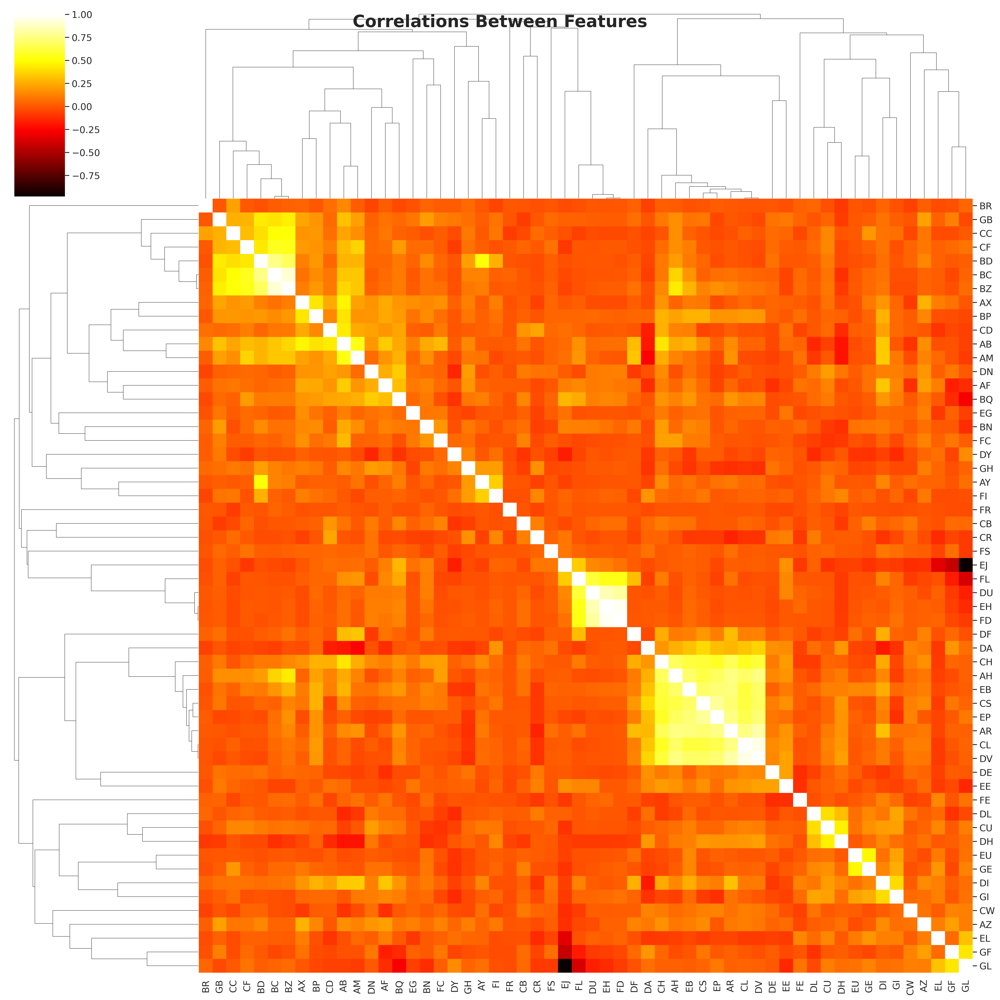

In [29]:
corr = train.loc[:, num_cols].corr()
sns.clustermap(corr, metric="correlation", cmap="hot", figsize=(20, 20))
plt.suptitle('Correlations Between Features', fontsize=24, weight='bold')
plt.show()

## Preprocessing

In [30]:
print("결측치 제거 전: ", train.shape)
train = train.dropna()
print("결측치 제거 후: ", train.shape)

결측치 제거 전:  (617, 57)
결측치 제거 후:  (548, 57)


In [31]:
y_train = train.pop('Class')
y_train.head(5)

0    1
1    0
2    0
3    0
4    1
Name: Class, dtype: int64

## Feature Engineering

In [32]:
X_train = train.copy()
X_test = test.copy()

X_train.shape, X_test.shape, y_train.shape, greeks.shape

((548, 56), (5, 56), (548,), (617, 6))

In [33]:
scale_cols = X_train.select_dtypes(include = ['float64', 'int64']).columns
scale_cols

Index(['AB', 'AF', 'AH', 'AM', 'AR', 'AX', 'AY', 'AZ', 'BC', 'BD', 'BN', 'BP',
       'BQ', 'BR', 'BZ', 'CB', 'CC', 'CD', 'CF', 'CH', 'CL', 'CR', 'CS', 'CU',
       'CW', 'DA', 'DE', 'DF', 'DH', 'DI', 'DL', 'DN', 'DU', 'DV', 'DY', 'EB',
       'EE', 'EG', 'EH', 'EJ', 'EL', 'EP', 'EU', 'FC', 'FD', 'FE', 'FI', 'FL',
       'FR', 'FS', 'GB', 'GE', 'GF', 'GH', 'GI', 'GL'],
      dtype='object')

In [34]:
# Scale

for col in scale_cols:
    scaler = StandardScaler()
    X_train[col] = scaler.fit_transform(X_train[[col]])
    X_test[col] = scaler.transform(X_test[[col]])

X_train.head(3)

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,BN,BP,BQ,BR,BZ,CB,CC,CD,CF,CH,CL,CR,CS,CU,CW,DA,DE,DF,DH,DI,DL,DN,DU,DV,DY,EB,EE,EG,EH,EJ,EL,EP,EU,FC,FD,FE,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL
0,-0.642235,-0.172774,-0.250118,-0.227473,-0.188976,-1.868727,-0.084651,-0.230824,-0.045799,-0.397258,0.275420,-0.311122,0.582106,-0.052561,-0.141068,-0.198280,-0.468801,-1.475995,-0.444019,-0.470669,-0.187127,-2.462594,-1.327331,-0.132538,0.598167,0.789142,-0.339629,-0.288324,-0.727408,-0.675288,-0.356264,0.359322,0.362399,-0.127086,-0.146961,-0.297072,-0.492694,-0.158422,0.321387,0.815876,-0.999801,-0.382286,-0.169750,-0.344317,0.042719,-0.146169,-2.179924,0.296407,-0.037777,-0.239129,-0.915619,-0.398553,-0.696224,-0.934968,0.458156,-0.891170
1,-0.804628,-1.107371,-0.250118,-0.014637,-0.188976,-0.697838,-0.084651,0.610406,-0.108445,0.036083,-0.610666,-0.416383,-0.866320,-0.148817,-0.141068,-0.309548,-0.759425,-0.844371,-0.355736,0.068278,-0.155781,1.397789,-0.508947,-0.029698,0.686540,0.868382,-0.709677,-0.288324,-0.027483,-0.430943,-0.652002,1.360102,-0.194287,-0.127086,-0.473188,-0.664863,-1.050992,-0.344263,-0.162208,-1.225677,1.027240,-0.145757,-0.052480,-0.322642,-0.102526,-0.338162,0.057842,-0.487647,-0.061134,0.105630,-1.118984,-0.398553,0.598418,-0.225854,-0.553962,1.197072
2,0.018166,-0.380696,-0.250118,-0.081934,-0.188976,0.540261,-0.084651,0.453033,-0.108445,-0.078122,1.358414,-0.559492,1.281498,-0.095137,-0.141068,-0.294576,-0.718318,-0.025246,-0.406463,0.391646,-0.187127,-0.139074,0.113779,-0.677590,-0.427462,0.869368,-0.257864,-0.288324,-1.379063,-0.322438,-1.006551,0.155524,-0.059530,-0.127086,0.600808,-0.216377,2.554014,-0.123255,0.029053,0.815876,1.027240,-0.382286,-0.165967,0.864078,0.020573,-0.205171,0.476627,0.341679,-0.052132,0.563666,1.642165,-0.292871,-0.114474,-0.338574,-0.471799,-0.883852


## Loss Function

In [35]:
def balanced_log_loss(y_true, y_pred):
    # 각 class 별로 관측치 수 계산
    N_0 = np.sum(1 - y_true)
    N_1 = np.sum(y_true)
    # weight 계산
    w_0 = 1 / N_0
    w_1 = 1 / N_1
    # 예측 확률 계산
    p_1 = np.clip(y_pred, 1e-15, 1 - 1e-15)
    p_0 = 1 - p_1
    # log loss 계산
    log_loss_0 = -np.sum((1 - y_true) * np.log(p_0))
    log_loss_1 = -np.sum(y_true * np.log(p_1))

    balanced_log_loss = 2*(w_0 * log_loss_0 + w_1 * log_loss_1) / (w_0 + w_1)

    return balanced_log_loss/(N_0+N_1)

## Modeling

### Split

In [36]:
from sklearn.model_selection import train_test_split

X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train, stratify = y_train, test_size = 0.2, random_state = 626)

### Validation

In [37]:
from sklearn.ensemble import RandomForestClassifier

# BaseLine 모델 RandomForestCliassifier
model = RandomForestClassifier()
model.fit(X_tr, y_tr)
pred = model.predict_proba(X_val)

pred_list = []
for arr in pred:
    res_class = np.argmax(arr)
    pred_list.append(res_class)

print("pred_list", pred_list)

# sklearn 의 log_loss 평가
print('log_loss: ', log_loss(y_val, pred))

# Kaggle 적용 평가 함수
print('balanced_log_loss: ', balanced_log_loss(y_val, pred_list))

pred_list [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
log_loss:  0.23896678984341652
balanced_log_loss:  5.252180210787839


In [38]:
# roc_auc_score

from sklearn.metrics import roc_auc_score
score = roc_auc_score(y_val, pred[:,1])
score

0.9588888888888889

### Model Select & predict

In [39]:
model = RandomForestClassifier()
model.fit(X_train, y_train)
pred = model.predict_proba(X_test)
pred

array([[0.44, 0.56],
       [0.44, 0.56],
       [0.44, 0.56],
       [0.44, 0.56],
       [0.44, 0.56]])